In [0]:
from keras import layers
from keras import models
from keras import optimizers
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np

In [7]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!wget 'https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip'

--2020-04-16 16:48:22--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.193.24.126, 2600:1417:76:586::e59, 2600:1417:76:58e::e59
Connecting to download.microsoft.com (download.microsoft.com)|23.193.24.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824894548 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_3367a.zip’

kagglecatsanddogs_3 100%[===================>] 786.68M   274MB/s    in 2.9s    

2020-04-16 16:48:25 (274 MB/s) - ‘kagglecatsanddogs_3367a.zip’ saved [824894548/824894548]



In [4]:
!unzip kagglecatsanddogs_3367a

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  
  inflating: PetImages/Dog/5523.jpg  

In [0]:
!rm -rf DL4_data
!mkdir DL4_data
os.chdir('DL4_data') 
!mkdir train
os.chdir('train') 
!mkdir Cat
!mkdir Dog
os.chdir('..') 
!mkdir validation
os.chdir('validation') 
!mkdir Cat
!mkdir Dog
os.chdir('..') 
!mkdir test 
os.chdir('test') 
!mkdir Cat
!mkdir Dog
os.chdir('/content')
!cp /content/PetImages/Cat/{0..1599}.jpg /content/DL4_data/train/Cat/
!cp /content/PetImages/Cat/{1600..1799}.jpg /content/DL4_data/validation/Cat/
!cp /content/PetImages/Cat/{1800..1999}.jpg /content/DL4_data/test/Cat/
!cp /content/PetImages/Dog/{0..1599}.jpg /content/DL4_data/train/Dog/
!cp /content/PetImages/Dog/{1600..1799}.jpg /content/DL4_data/validation/Dog/
!cp /content/PetImages/Dog/{1800..1999}.jpg /content/DL4_data/test/Dog/

In [0]:
!rm /content/DL4_data/train/Cat/666.jpg
!rm /content/DL4_data/train/Dog/666.jpg

In [7]:
!ls -lR DL4_data/

DL4_data/:
total 12
drwxr-xr-x 4 root root 4096 Apr 16 16:49 test
drwxr-xr-x 4 root root 4096 Apr 16 16:49 train
drwxr-xr-x 4 root root 4096 Apr 16 16:49 validation

DL4_data/test:
total 8
drwxr-xr-x 2 root root 4096 Apr 16 16:49 Cat
drwxr-xr-x 2 root root 4096 Apr 16 16:49 Dog

DL4_data/test/Cat:
total 6680
-rw-r--r-- 1 root root  50133 Apr 16 16:49 1800.jpg
-rw-r--r-- 1 root root  27472 Apr 16 16:49 1801.jpg
-rw-r--r-- 1 root root  20990 Apr 16 16:49 1802.jpg
-rw-r--r-- 1 root root  20921 Apr 16 16:49 1803.jpg
-rw-r--r-- 1 root root   9178 Apr 16 16:49 1804.jpg
-rw-r--r-- 1 root root  25319 Apr 16 16:49 1805.jpg
-rw-r--r-- 1 root root  18867 Apr 16 16:49 1806.jpg
-rw-r--r-- 1 root root  19794 Apr 16 16:49 1807.jpg
-rw-r--r-- 1 root root  13132 Apr 16 16:49 1808.jpg
-rw-r--r-- 1 root root  18411 Apr 16 16:49 1809.jpg
-rw-r--r-- 1 root root  28393 Apr 16 16:49 1810.jpg
-rw-r--r-- 1 root root  28808 Apr 16 16:49 1811.jpg
-rw-r--r-- 1 root root  32750 Apr 16 16:49 1812.jpg
-rw-r--r-- 1 r

In [8]:
train_gen = ImageDataGenerator(rescale=1./255)
val_gen = ImageDataGenerator(rescale=1./255)
test_gen = ImageDataGenerator(rescale=1./255)

train_generator = train_gen.flow_from_directory(
    '/content/DL4_data/train',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

val_generator = train_gen.flow_from_directory(
    '/content/DL4_data/validation',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

test_generator = train_gen.flow_from_directory(
    '/content/DL4_data/test',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

Found 3198 images belonging to 2 classes.
Found 400 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [9]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation='relu', input_shape=(150,150,3)))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(64, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512,activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 128)      

In [0]:
from keras import optimizers
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])

In [11]:
history = model.fit_generator(train_generator, steps_per_epoch=100, epochs=50, validation_data = val_generator, validation_steps = 50)
#model.save('D:/Data Science/deep learning/assignment-4/PetImages/cats_and_dogs.h5')

Epoch 1/50
100/100 [==============================] - 14s 141ms/step - loss: 0.6889 - acc: 0.5300 - val_loss: 0.6439 - val_acc: 0.5460
Epoch 2/50
100/100 [==============================] - 8s 79ms/step - loss: 0.6594 - acc: 0.6175 - val_loss: 0.5979 - val_acc: 0.6500
Epoch 3/50
100/100 [==============================] - 8s 79ms/step - loss: 0.6365 - acc: 0.6370 - val_loss: 0.7058 - val_acc: 0.6380
Epoch 4/50
100/100 [==============================] - 8s 79ms/step - loss: 0.5922 - acc: 0.6814 - val_loss: 0.6571 - val_acc: 0.6300
Epoch 5/50
100/100 [==============================] - 8s 80ms/step - loss: 0.5650 - acc: 0.7100 - val_loss: 0.6585 - val_acc: 0.6540
Epoch 6/50
100/100 [==============================] - 8s 79ms/step - loss: 0.5481 - acc: 0.7137 - val_loss: 0.6531 - val_acc: 0.6330
Epoch 7/50
100/100 [==============================] - 8s 80ms/step - loss: 0.4963 - acc: 0.7625 - val_loss: 0.8886 - val_acc: 0.7060
Epoch 8/50
100/100 [==============================] - 8s 79ms/step 

In [0]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1,len(acc)+1)

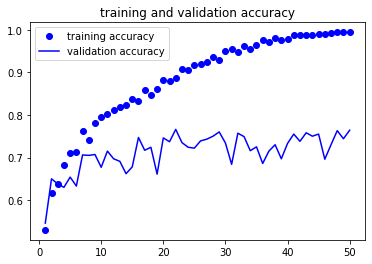

In [13]:
plt.plot(epochs, acc, 'bo', label='training accuracy')
plt.plot(epochs, val_acc, 'b', label = 'validation accuracy')
plt.title('training and validation accuracy')
plt.legend()
plt.show()

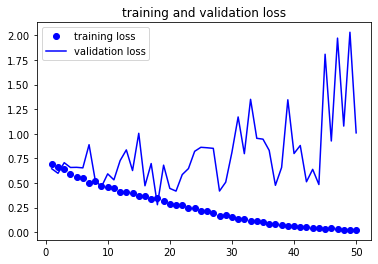

In [14]:
plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'b', label = 'validation loss')
plt.title('training and validation loss')
plt.legend()
plt.show()

In [15]:
#retraining the model with chosen hyperparamter
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation='relu', input_shape=(150,150,3)))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(64, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Conv2D(128, (3,3), activation='relu'))
model.add(layers.MaxPool2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512,activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))
model.summary()
from keras import optimizers
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
cnn_basic_model = model.fit_generator(train_generator, steps_per_epoch=100, epochs=18)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)      

In [0]:
#model.save('basic-cat-vs-dog.h5')
model_loaded = load_model('basic-cat-vs-dog.h5')

In [17]:
#test loss and accuracy
#test_loss, test_accuracy = model.evaluate_generator(test_generator, steps= 25)
#print (test_accuracy, test_loss)

0.7559999823570251 0.512191116809845


In [12]:
test_loss, test_accuracy = model_loaded.evaluate_generator(test_generator, steps= 18)
print (test_accuracy, test_loss)

0.75 0.4849088191986084


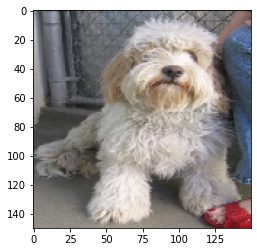

In [16]:

img_path = '/content/DL4_data/test/Dog/1805.jpg'
from keras.preprocessing import image
import numpy as np
img = image.load_img(img_path, target_size = (150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255
#print (img_tensor.shape)

import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

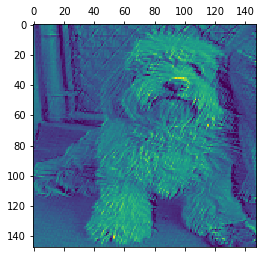

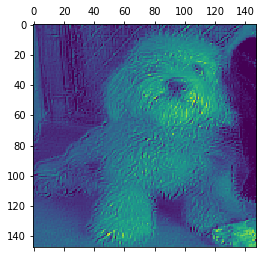

In [18]:
#from keras.models import load_model
#model_loaded = load_model('D:/Data Science/deep learning/assignment-4/cats_and_dogs-2.h5')
from keras import models
layer_outputs = []
for layer in model_loaded.layers[:8]:
    layer_outputs.append(layer.output)
#layer_outputs = [layer.ouput for layer in model_loaded.layers[:8]]

activation_model = models.Model(inputs=model_loaded.input, outputs= layer_outputs)
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
#print (first_layer_activation.shape)

import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0,:,:,4], cmap = 'viridis' )
plt.matshow(first_layer_activation[0,:,:,1], cmap = 'viridis' )



['conv2d_5', 'max_pooling2d_5', 'conv2d_6', 'max_pooling2d_6', 'conv2d_7', 'max_pooling2d_7', 'conv2d_8', 'max_pooling2d_8']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


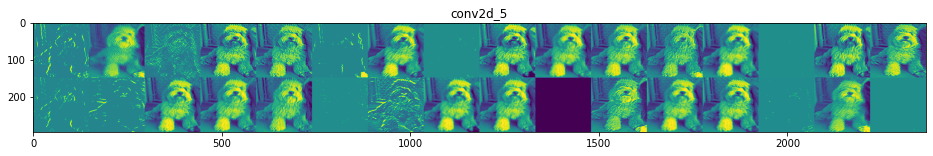

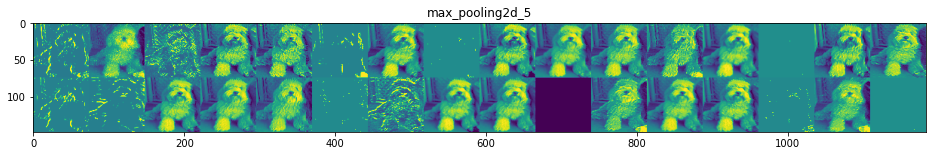

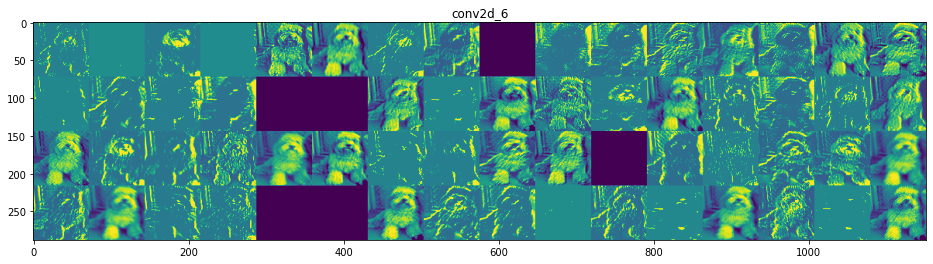

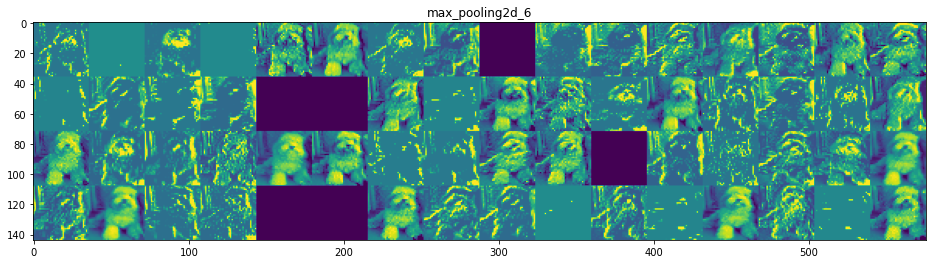

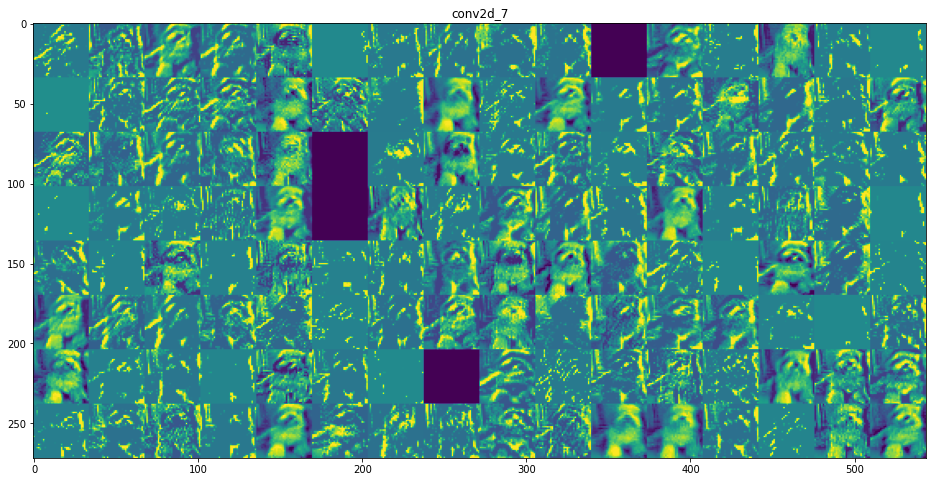

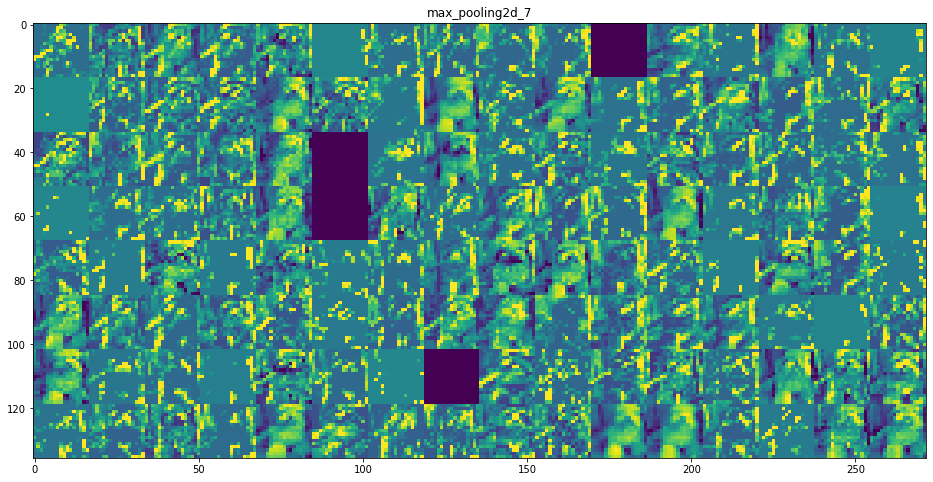

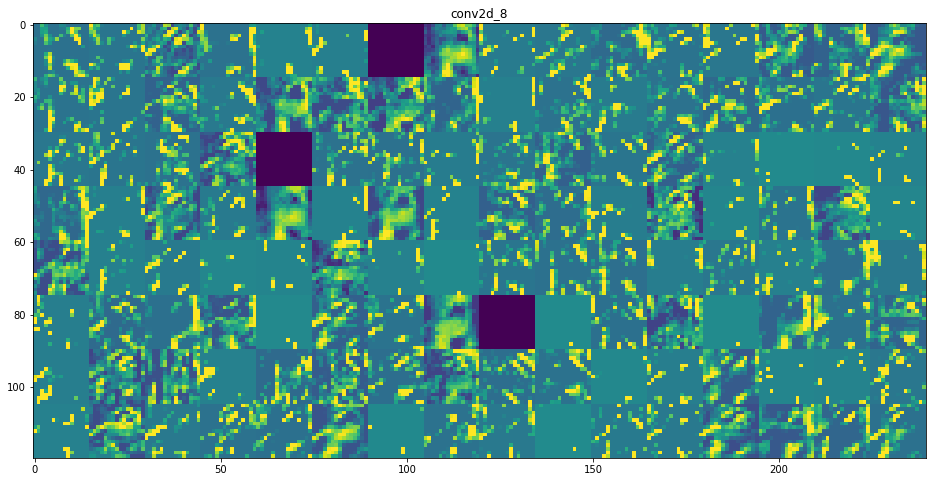

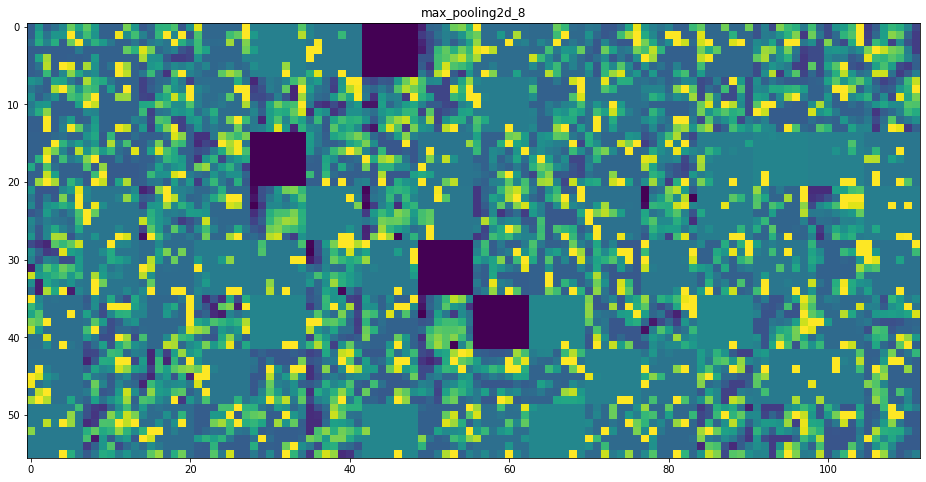

In [19]:
layer_names = []
for layer in model_loaded.layers[:8]:
    layer_names.append(layer.name)
print (layer_names)    

images_per_row = 16

for layer_name, layer_activations in zip(layer_names, activations):
    n_features = layer_activations.shape[-1]
    size = layer_activations.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size*n_cols, images_per_row*size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activations[0,:,:,col*images_per_row+row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image,0,255).astype('uint8')
            display_grid[col*size:(col+1)*size, row*size:(row+1)*size] = channel_image
    scale = 1./size
    plt.figure(figsize=(scale*display_grid.shape[1],scale*display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid,aspect='auto',cmap = 'viridis')           

(None, 148, 148, 32)
(None, 72, 72, 64)
(None, 34, 34, 128)


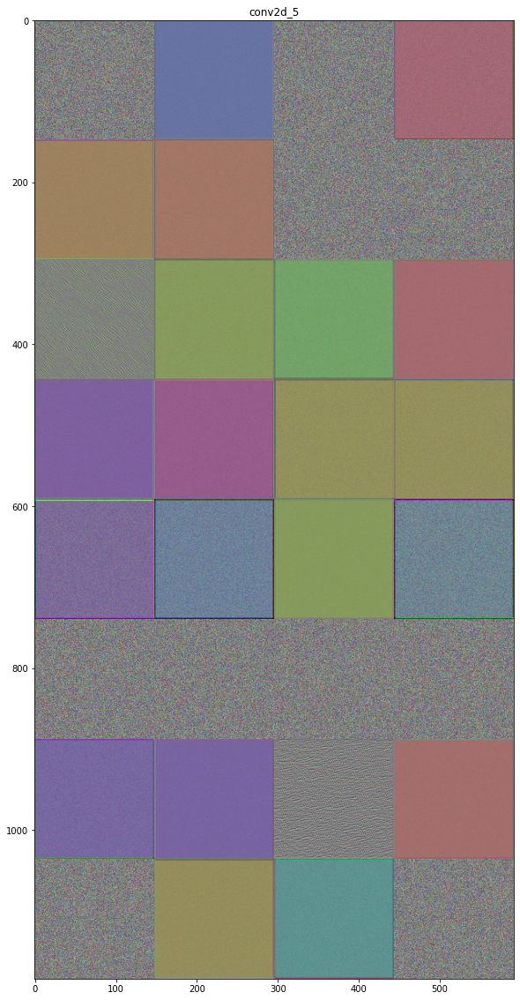

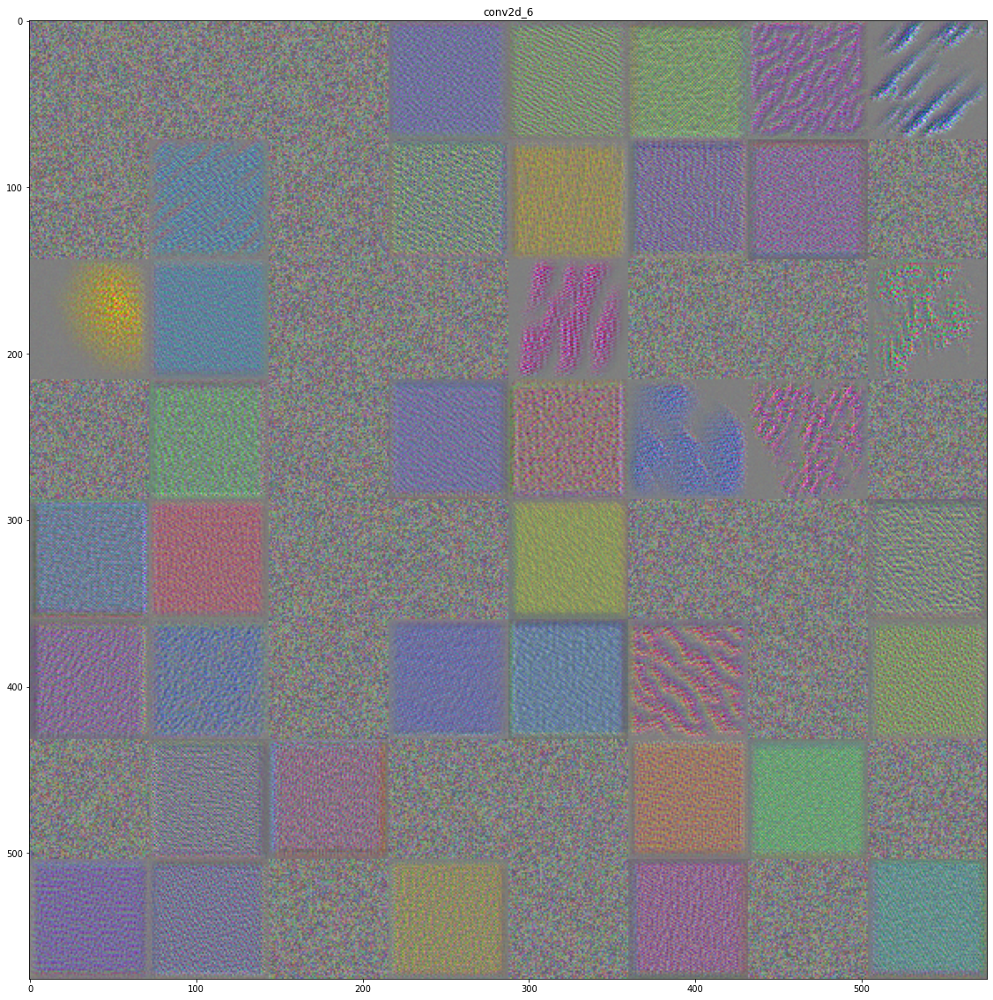

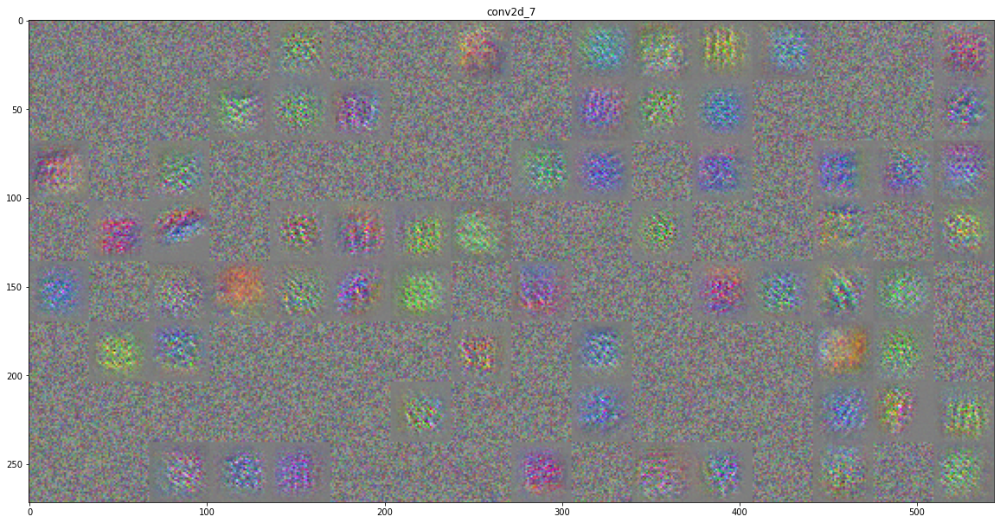

In [20]:
from keras import backend as K
#model=load_model('cats_and_dogs_small_1.h5')  

def deprocess_image(x):
    x-=x.mean()
    x/=(x.std()+1e-5)
    x*=0.1
    x+=0.5
    x=np.clip(x,0,1)
    x*=255
    #Clip to [0,255] and convert to unsigned byte channels
    x=np.clip(x,0,255).astype('uint8')
    return x

def generate_pattern(layer_name,filter_index,size=150):
    #Define Output and Loss
    layer_output=model_loaded.get_layer(layer_name).output
    loss=K.mean(layer_output[:,:,:,filter_index])
    #Compute the gradient of the input with respect to loss
    grads=K.gradients(loss,model_loaded.input)[0]
    grads/=((K.sqrt(K.mean(K.square(grads))))+1e-5)
    iterate=K.function([model_loaded.input], [loss,grads])
    input_img_data=np.random.random((1,size,size,3))*20+128
   
    step=1
    for i in range(100):
        loss_value,grads_value=iterate([input_img_data])
        input_img_data+=grads_value*step
       
    img=input_img_data[0]
    return deprocess_image(img)


#layer_names=[]
#for layer in model.layers:
    #print(layer.name)
    #layer_names.append(layer.name)

layer_names=[]
conv_ly1=model_loaded.layers[0].name
layer_names.append(conv_ly1)
conv_ly2=model_loaded.layers[2].name
layer_names.append(conv_ly2)
conv_ly3=model_loaded.layers[4].name
layer_names.append(conv_ly3)


k=0
for layer_name in layer_names:
    layer=model_loaded.layers[k]
    layer_output=layer.output
    print(layer_output.shape)
    size=int(layer_output.shape[1])
    row=8
    col=int(layer_output.shape[3]//row)
    results=np.zeros((row*size,col*size,3)).astype('uint0')
   
    for i in range(row):
        for j in range(col):
            filter_img=generate_pattern(layer_name,i+(j*8),size=size)        
            horizontal_start=i*size
            horizontal_end=horizontal_start+size
            vertical_start=j*size
            vertical_end=vertical_start+size
            results[horizontal_start:horizontal_end,vertical_start:vertical_end,:]=filter_img[:,:,:]
    plt.figure(figsize=(20,20))
    plt.title(layer_name) 
    plt.imshow(results)
    k+=2                                    

In [21]:
from keras.applications import VGG16
from keras import backend as k
conv_base = VGG16(weights='imagenet', include_top= False, input_shape=(150,150,3))
conv_base.summary()

58892288/58889256 [==============================] - 5s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
______________________________________________________________

In [22]:
from keras import models
from keras import layers
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


In [27]:

print ("before freezing : "+ str(len(model.trainable_weights)))
conv_base.trainable= False
print ("after freezing : "+str(len(model.trainable_weights)))
from keras import optimizers 
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
history = model.fit_generator(train_generator, steps_per_epoch=150, epochs=50, validation_data = val_generator, validation_steps = 50)


before freezing : 4
after freezing : 4
Epoch 1/50
150/150 [==============================] - 13s 89ms/step - loss: 0.3643 - acc: 0.8376 - val_loss: 0.1661 - val_acc: 0.8810
Epoch 2/50
150/150 [==============================] - 13s 85ms/step - loss: 0.2347 - acc: 0.9033 - val_loss: 0.1568 - val_acc: 0.8770
Epoch 3/50
150/150 [==============================] - 12s 82ms/step - loss: 0.1703 - acc: 0.9306 - val_loss: 0.2035 - val_acc: 0.8930
Epoch 4/50
150/150 [==============================] - 12s 82ms/step - loss: 0.1531 - acc: 0.9363 - val_loss: 0.1147 - val_acc: 0.8850
Epoch 5/50
150/150 [==============================] - 12s 81ms/step - loss: 0.1206 - acc: 0.9553 - val_loss: 0.0772 - val_acc: 0.8980
Epoch 6/50
150/150 [==============================] - 12s 82ms/step - loss: 0.1061 - acc: 0.9633 - val_loss: 0.4476 - val_acc: 0.8600
Epoch 7/50
150/150 [==============================] - 12s 82ms/step - loss: 0.0834 - acc: 0.9706 - val_loss: 0.1728 - val_acc: 0.9070
Epoch 8/50
150/150 [===

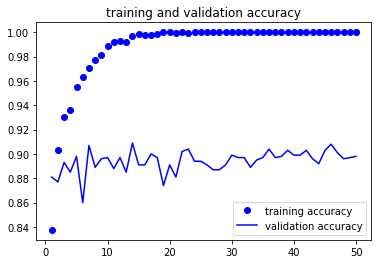

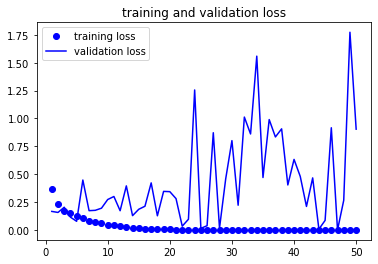

In [28]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1,len(acc)+1)


plt.plot(epochs, acc, 'bo', label='training accuracy')
plt.plot(epochs, val_acc, 'b', label = 'validation accuracy')
plt.title('training and validation accuracy')
plt.legend()
plt.show()

plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'b', label = 'validation loss')
plt.title('training and validation loss')
plt.legend()
plt.show() 

In [29]:
for v_loss, v_acc in zip(val_loss, val_acc):
  print (v_loss,v_acc)

0.16605804860591888 0.8809999823570251
0.15680661797523499 0.8769999742507935
0.20346853137016296 0.8930000066757202
0.11471763998270035 0.8849999904632568
0.07718423008918762 0.8980000019073486
0.4475851058959961 0.8600000143051147
0.17276689410209656 0.9070000052452087
0.1758173406124115 0.8889999985694885
0.19492533802986145 0.8960000276565552
0.27266448736190796 0.8970000147819519
0.29985204339027405 0.8880000114440918
0.1722247153520584 0.8970000147819519
0.3950747847557068 0.8849999904632568
0.1279868632555008 0.9089999794960022
0.18518993258476257 0.890999972820282
0.21245059370994568 0.890999972820282
0.4219662547111511 0.8999999761581421
0.12677304446697235 0.8970000147819519
0.34573858976364136 0.8740000128746033
0.3433418273925781 0.890999972820282
0.28091421723365784 0.8809999823570251
0.03361402824521065 0.9020000100135803
0.09564993530511856 0.9039999842643738
1.2557132244110107 0.8939999938011169
0.013988986611366272 0.8939999938011169
0.037791889160871506 0.890999972820

In [40]:
from keras import models
from keras import layers
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))

conv_base.trainable= False
from keras import optimizers
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
vgg16_froze = model.fit_generator(train_generator, steps_per_epoch=150, epochs=5)

Epoch 1/5
150/150 [==============================] - 10s 65ms/step - loss: 0.3685 - acc: 0.8346
Epoch 2/5
150/150 [==============================] - 10s 64ms/step - loss: 0.2254 - acc: 0.9066
Epoch 3/5
150/150 [==============================] - 10s 64ms/step - loss: 0.1833 - acc: 0.9266
Epoch 4/5
150/150 [==============================] - 10s 65ms/step - loss: 0.1468 - acc: 0.9430
Epoch 5/5
150/150 [==============================] - 10s 65ms/step - loss: 0.1252 - acc: 0.9537


In [41]:
test_loss, test_accuracy = model.evaluate_generator(test_generator)

print (test_accuracy, test_loss)

0.9049999713897705 0.3842967450618744


In [42]:
model.save('vgg16-froze-cat-vs-dog.h5')
model_loaded = load_model('vgg16-froze-cat-vs-dog.h5')
test_loss, test_accuracy = model_loaded.evaluate_generator(test_generator)
print (test_accuracy, test_loss)

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:384: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


0.9049999713897705 0.3842967450618744


In [43]:
conv_base.trainable= True
from keras import optimizers
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
history = model.fit_generator(train_generator, steps_per_epoch=150, epochs=30, validation_data = val_generator, validation_steps = 50)

Epoch 1/30
150/150 [==============================] - 19s 128ms/step - loss: 0.7716 - acc: 0.6134 - val_loss: 0.6226 - val_acc: 0.6080
Epoch 2/30
150/150 [==============================] - 17s 117ms/step - loss: 0.4125 - acc: 0.8222 - val_loss: 0.4431 - val_acc: 0.8400
Epoch 3/30
150/150 [==============================] - 17s 115ms/step - loss: 0.2734 - acc: 0.8886 - val_loss: 0.4750 - val_acc: 0.8630
Epoch 4/30
150/150 [==============================] - 18s 117ms/step - loss: 0.1796 - acc: 0.9260 - val_loss: 0.1896 - val_acc: 0.8960
Epoch 5/30
150/150 [==============================] - 17s 116ms/step - loss: 0.1524 - acc: 0.9467 - val_loss: 0.2683 - val_acc: 0.8780
Epoch 6/30
150/150 [==============================] - 18s 117ms/step - loss: 0.1313 - acc: 0.9583 - val_loss: 0.0952 - val_acc: 0.8920
Epoch 7/30
150/150 [==============================] - 17s 115ms/step - loss: 0.1010 - acc: 0.9656 - val_loss: 0.2903 - val_acc: 0.8760
Epoch 8/30
150/150 [==============================] - 1

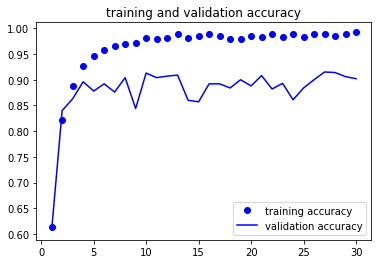

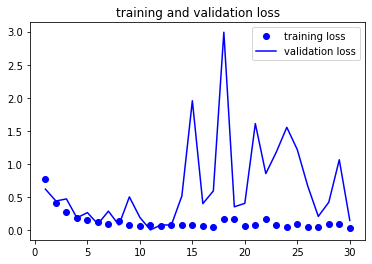

In [44]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1,len(acc)+1)


plt.plot(epochs, acc, 'bo', label='training accuracy')
plt.plot(epochs, val_acc, 'b', label = 'validation accuracy')
plt.title('training and validation accuracy')
plt.legend()
plt.show()

plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'b', label = 'validation loss')
plt.title('training and validation loss')
plt.legend()
plt.show() 

In [45]:
for v_loss, v_acc in zip(val_loss, val_acc):
  print (v_loss,v_acc)

0.6226418018341064 0.6079999804496765
0.44306546449661255 0.8399999737739563
0.4750286638736725 0.8629999756813049
0.18957898020744324 0.8960000276565552
0.2682570815086365 0.878000020980835
0.09515140950679779 0.8920000195503235
0.2902868986129761 0.8759999871253967
0.08072763681411743 0.9039999842643738
0.505412757396698 0.843999981880188
0.1954738199710846 0.9129999876022339
0.006982768420130014 0.9039999842643738
0.08226723968982697 0.9070000052452087
0.08137844502925873 0.9089999794960022
0.5189831256866455 0.8600000143051147
1.956913948059082 0.8569999933242798
0.40402159094810486 0.8920000195503235
0.5952625274658203 0.8920000195503235
2.9904797077178955 0.8840000033378601
0.3557128310203552 0.8999999761581421
0.4081090986728668 0.8880000114440918
1.611911416053772 0.9079999923706055
0.8567711710929871 0.8820000290870667
1.1818737983703613 0.8930000066757202
1.5556522607803345 0.8610000014305115
1.2184278964996338 0.8840000033378601
0.6665612459182739 0.8999999761581421
0.211048

In [48]:
from keras import models
from keras import layers
model_froze = load_model('vgg16-froze-cat-vs-dog.h5')

conv_base.trainable= True
from keras import optimizers
model_froze.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
vgg16_unfreeze = model_froze.fit_generator(train_generator, steps_per_epoch=150, epochs=12)

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:384: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


Epoch 1/12
150/150 [==============================] - 15s 100ms/step - loss: 0.6590 - acc: 0.6458
Epoch 2/12
150/150 [==============================] - 15s 97ms/step - loss: 0.3269 - acc: 0.8639
Epoch 3/12
150/150 [==============================] - 15s 97ms/step - loss: 0.2460 - acc: 0.9049
Epoch 4/12
150/150 [==============================] - 15s 97ms/step - loss: 0.1722 - acc: 0.9343
Epoch 5/12
150/150 [==============================] - 15s 97ms/step - loss: 0.1580 - acc: 0.9453
Epoch 6/12
150/150 [==============================] - 15s 97ms/step - loss: 0.1084 - acc: 0.9630
Epoch 7/12
150/150 [==============================] - 15s 97ms/step - loss: 0.0921 - acc: 0.9703
Epoch 8/12
150/150 [==============================] - 15s 97ms/step - loss: 0.0830 - acc: 0.9720
Epoch 9/12
150/150 [==============================] - 15s 98ms/step - loss: 0.0843 - acc: 0.9737
Epoch 10/12
150/150 [==============================] - 15s 97ms/step - loss: 0.0762 - acc: 0.9813
Epoch 11/12
150/150 [=======

In [50]:
test_loss, test_accuracy = model_froze.evaluate_generator(test_generator)
print (test_accuracy, test_loss)


0.9225000143051147 0.5954384207725525


In [53]:
model_froze.save('vgg16-unfreeze-cat_vs-dog.h5')
unfrozen_model = load_model('vgg16-unfreeze-cat_vs-dog.h5')
test_loss, test_accuracy = unfrozen_model.evaluate_generator(test_generator)
print (test_accuracy, test_loss)

0.9225000143051147 0.5954384207725525


In [63]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers

train_datagen = ImageDataGenerator(rescale= 1./255, rotation_range= 40, width_shift_range = 0.2, height_shift_range = 0.2, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True, fill_mode= 'nearest')
val_gen = ImageDataGenerator(rescale=1./255)
test_gen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    '/content/DL4_data/train',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

val_generator = val_gen.flow_from_directory(
    '/content/DL4_data/validation',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

test_generator = test_gen.flow_from_directory(
    '/content/DL4_data/test',
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary'
)

Found 3198 images belonging to 2 classes.
Found 400 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [64]:
from keras import models
from keras import layers
model_aug = models.Sequential()
model_aug.add(conv_base)
model_aug.add(layers.Flatten())
model_aug.add(layers.Dense(256, activation='relu'))
model_aug.add(layers.Dense(1,activation='sigmoid'))

conv_base.trainable= False
from keras import optimizers
model_aug.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
vgg16_froze = model_aug.fit_generator(train_generator, steps_per_epoch=150, epochs=40, validation_data = val_generator, validation_steps = 50)

Epoch 1/40
150/150 [==============================] - 26s 172ms/step - loss: 0.4366 - acc: 0.8299 - val_loss: 0.1250 - val_acc: 0.8880
Epoch 2/40
150/150 [==============================] - 25s 166ms/step - loss: 0.3581 - acc: 0.8516 - val_loss: 0.2042 - val_acc: 0.9030
Epoch 3/40
150/150 [==============================] - 24s 162ms/step - loss: 0.3256 - acc: 0.8612 - val_loss: 0.2198 - val_acc: 0.8980
Epoch 4/40
150/150 [==============================] - 24s 162ms/step - loss: 0.3339 - acc: 0.8622 - val_loss: 0.5035 - val_acc: 0.9060
Epoch 5/40
150/150 [==============================] - 24s 161ms/step - loss: 0.3214 - acc: 0.8643 - val_loss: 0.2261 - val_acc: 0.9150
Epoch 6/40
150/150 [==============================] - 24s 163ms/step - loss: 0.3332 - acc: 0.8611 - val_loss: 0.1203 - val_acc: 0.8960
Epoch 7/40
150/150 [==============================] - 24s 161ms/step - loss: 0.3242 - acc: 0.8600 - val_loss: 0.1964 - val_acc: 0.9020
Epoch 8/40
150/150 [==============================] - 2

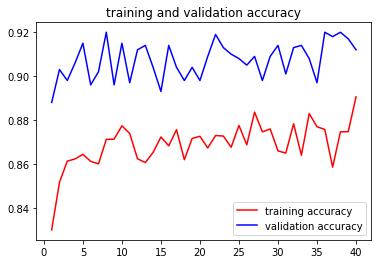

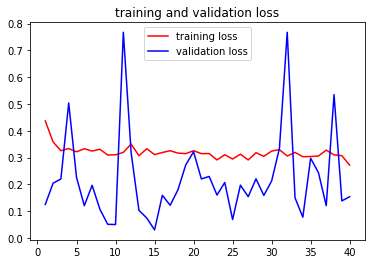

In [66]:
import matplotlib.pyplot as plt
acc = vgg16_froze.history['acc']
val_acc = vgg16_froze.history['val_acc']
loss = vgg16_froze.history['loss']
val_loss = vgg16_froze.history['val_loss']
epochs = range(1,len(acc)+1)


plt.plot(epochs, acc, 'r', label='training accuracy')
plt.plot(epochs, val_acc, 'b', label = 'validation accuracy')
plt.title('training and validation accuracy')
plt.legend()
plt.show()

plt.plot(epochs, loss, 'r', label='training loss')
plt.plot(epochs, val_loss, 'b', label = 'validation loss')
plt.title('training and validation loss')
plt.legend()
plt.show()

In [57]:
for v_loss, v_acc in zip(val_loss, val_acc):
  print (v_loss,v_acc)

0.362997829914093 0.8989999890327454
0.2804698646068573 0.8920000195503235
0.004825678654015064 0.8949999809265137
1.0095945596694946 0.902999997138977
1.0310462713241577 0.8849999904632568
2.1940808296203613 0.8859999775886536
0.6320799589157104 0.8949999809265137
0.9602057337760925 0.8989999890327454
0.24733778834342957 0.890999972820282
0.02710695192217827 0.8930000066757202
0.24287159740924835 0.8999999761581421
2.0496199131011963 0.8949999809265137
1.7601096630096436 0.8960000276565552
0.5328823924064636 0.8870000243186951
1.4378254413604736 0.8939999938011169
1.16241455078125 0.8949999809265137
2.285212278366089 0.8960000276565552
0.2604703903198242 0.8960000276565552
4.463168621063232 0.8939999938011169
5.529314994812012 0.8960000276565552
1.0382627248764038 0.8939999938011169
2.1470565795898438 0.8920000195503235
0.9735797047615051 0.8960000276565552
3.131070137023926 0.8949999809265137
1.6914746761322021 0.8899999856948853
1.9634110927581787 0.8999999761581421
1.63125073909759

In [67]:
from keras import models
from keras import layers
model_aug = models.Sequential()
model_aug.add(conv_base)
model_aug.add(layers.Flatten())
model_aug.add(layers.Dense(256, activation='relu'))
model_aug.add(layers.Dense(1,activation='sigmoid'))

conv_base.trainable= False
from keras import optimizers
model_aug.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
vgg16_data_aug_froze = model_aug.fit_generator(train_generator, steps_per_epoch=150, epochs=15)

Epoch 1/15
150/150 [==============================] - 22s 146ms/step - loss: 0.4761 - acc: 0.8145
Epoch 2/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3465 - acc: 0.8579
Epoch 3/15
150/150 [==============================] - 22s 147ms/step - loss: 0.3365 - acc: 0.8512
Epoch 4/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3471 - acc: 0.8522
Epoch 5/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3488 - acc: 0.8546
Epoch 6/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3236 - acc: 0.8646
Epoch 7/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3425 - acc: 0.8517
Epoch 8/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3361 - acc: 0.8555
Epoch 9/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3257 - acc: 0.8649
Epoch 10/15
150/150 [==============================] - 22s 146ms/step - loss: 0.3396 - acc: 0.8662
Epoch 11/15
150/150

In [68]:
test_loss, test_accuracy = model_aug.evaluate_generator(test_generator)
print (test_accuracy, test_loss)

0.9275000095367432 0.17063912749290466


In [0]:
model_aug.save('vgg16-data-aug-1-dog-vs-cat.h5')

In [71]:
vgg16_data_aug_froze = load_model('vgg16-data-aug-1-dog-vs-cat.h5')
test_loss, test_accuracy = vgg16_data_aug_froze.evaluate_generator(test_generator)
print (test_accuracy, test_loss)

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:384: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


0.9275000095367432 0.17063912749290466
